In [ ]:
!pip install scikit-learn
!pip install xgboost
!pip install lightgbm
!pip install keras
!pip install catboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.2/98.2 MB 6.8 MB/s eta 0:00:00


In [ ]:
!pip install ydata-profiling
!pip install shap
!pip install scikeras

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 357.9/357.9 kB 4.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 10.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 12.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 293.3/293.3 kB 10.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 12.3 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27080 sha256=31dd488ed94e4156bd6ff0106d5771612d9b4b02d799b09d13d3be61923eaaeb
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attempting uninstall: seaborn
    Found existing installation: seaborn 0.13.1
    Uninstalling seaborn-0.13.1:
      Successfully uninstalled seaborn-0.13.1
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 538.2/538.2 kB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

# Preprocessing
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.metrics import classification_report, accuracy_score
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.metrics import mean_squared_error
import ydata_profiling as yp

# Models
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics
import xgboost as xgb
from xgboost import XGBClassifier
import lightgbm as lgb
from lightgbm import LGBMClassifier
import catboost
from catboost import CatBoostClassifier, CatBoostRegressor

# model tuning
# from hyperopt import STATUS_OK, Trials, fmin, hp, tpe, space_eval

# Import warnings filter
from warnings import simplefilter
# Ignore all future warnings
simplefilter(action='ignore', category=FutureWarning)

# Importing SHAP
import shap

In [ ]:
data = pd.read_csv("cardio_train.csv", sep=";")

In [ ]:
def clean_dataset(df):
    assert isinstance(df, pd.DataFrame), "df needs to be a pd.DataFrame"
    df.dropna(inplace=True)
    indices_to_keep = ~df.isin([np.nan, np.inf, -np.inf]).any(axis=1)
    return df[indices_to_keep].astype(np.float64)

In [ ]:
clean_dataset(data)

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0.0,18393.0,2.0,168.0,62.0,110.0,80.0,1.0,1.0,0.0,0.0,1.0,0.0
1,1.0,20228.0,1.0,156.0,85.0,140.0,90.0,3.0,1.0,0.0,0.0,1.0,1.0
2,2.0,18857.0,1.0,165.0,64.0,130.0,70.0,3.0,1.0,0.0,0.0,0.0,1.0
3,3.0,17623.0,2.0,169.0,82.0,150.0,100.0,1.0,1.0,0.0,0.0,1.0,1.0
4,4.0,17474.0,1.0,156.0,56.0,100.0,60.0,1.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
69995,99993.0,19240.0,2.0,168.0,76.0,120.0,80.0,1.0,1.0,1.0,0.0,1.0,0.0
69996,99995.0,22601.0,1.0,158.0,126.0,140.0,90.0,2.0,2.0,0.0,0.0,1.0,1.0
69997,99996.0,19066.0,2.0,183.0,105.0,180.0,90.0,3.0,1.0,0.0,1.0,0.0,1.0
69998,99998.0,22431.0,1.0,163.0,72.0,135.0,80.0,1.0,2.0,0.0,0.0,0.0,1.0


In [ ]:
data.drop("id",axis=1,inplace=True)
data.drop_duplicates(inplace=True)
data["bmi"] = data["weight"] / (data["height"]/100)**2
#Removing outliers
out_filter = ((data["ap_hi"]>250) | (data["ap_lo"]>200))
data = data[~out_filter]
len(data)

68983

In [ ]:
out_filter2 = ((data["ap_hi"] < 0) | (data["ap_lo"] < 0))
data = data[~out_filter2]

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 68975 entries, 0 to 69999
Data columns (total 13 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   age          68975 non-null  int64  
 1   gender       68975 non-null  int64  
 2   height       68975 non-null  int64  
 3   weight       68975 non-null  float64
 4   ap_hi        68975 non-null  int64  
 5   ap_lo        68975 non-null  int64  
 6   cholesterol  68975 non-null  int64  
 7   gluc         68975 non-null  int64  
 8   smoke        68975 non-null  int64  
 9   alco         68975 non-null  int64  
 10  active       68975 non-null  int64  
 11  cardio       68975 non-null  int64  
 12  bmi          68975 non-null  float64
dtypes: float64(2), int64(11)
memory usage: 7.4 MB


In [ ]:
yp.ProfileReport(data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
target_name = 'cardio'
data_target = data[target_name]
data = data.drop([target_name], axis=1)

In [ ]:
train, test, target, target_test = train_test_split(data, data_target, test_size=0.2, random_state=0)

In [ ]:
train.head(3)

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,bmi
31684,21263,2,160,76.0,130,80,1,1,0,1,1,29.687500
5634,14684,2,184,70.0,120,80,1,1,0,0,1,20.675803
58675,23436,1,158,76.0,120,80,1,1,0,0,1,30.443839


In [ ]:
test.head(3)

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,bmi
51756,20272,1,161,75.0,120,80,1,1,0,0,1,28.934069
9378,21872,1,175,70.0,120,70,1,1,0,0,1,22.857143
5060,18140,1,165,65.0,120,80,2,2,0,0,1,23.875115


In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 55180 entries, 31684 to 69281
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   age          55180 non-null  int64  
 1   gender       55180 non-null  int64  
 2   height       55180 non-null  int64  
 3   weight       55180 non-null  float64
 4   ap_hi        55180 non-null  int64  
 5   ap_lo        55180 non-null  int64  
 6   cholesterol  55180 non-null  int64  
 7   gluc         55180 non-null  int64  
 8   smoke        55180 non-null  int64  
 9   alco         55180 non-null  int64  
 10  active       55180 non-null  int64  
 11  bmi          55180 non-null  float64
dtypes: float64(2), int64(10)
memory usage: 5.5 MB


In [ ]:
test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 13795 entries, 51756 to 61199
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   age          13795 non-null  int64  
 1   gender       13795 non-null  int64  
 2   height       13795 non-null  int64  
 3   weight       13795 non-null  float64
 4   ap_hi        13795 non-null  int64  
 5   ap_lo        13795 non-null  int64  
 6   cholesterol  13795 non-null  int64  
 7   gluc         13795 non-null  int64  
 8   smoke        13795 non-null  int64  
 9   alco         13795 non-null  int64  
 10  active       13795 non-null  int64  
 11  bmi          13795 non-null  float64
dtypes: float64(2), int64(10)
memory usage: 1.4 MB


In [ ]:
# Spliting training set to validation set
Xtrain, Xval, Ytrain, Yval = train_test_split(train, target, test_size=0.2, random_state=0)

In [ ]:
# Logistic Regression

logreg = LogisticRegression()
logreg.fit(train, target)
y_pred_logreg = logreg.predict(test)
y_pred_logregt = logreg.predict(train)
accuracy_logregt = accuracy_score(target, y_pred_logregt)
print(f"Training Accuracy(Logistic Regression)", (accuracy_logregt)*100)
accuracy_logreg = accuracy_score(target_test, y_pred_logreg)
print(f"Testing Accuracy(Logistic Regression):", (accuracy_logreg)*100)

# Classification Report
print("\nLogistic Regression Classification Report:")
print(classification_report(target_test, y_pred_logreg))

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training Accuracy(Logistic Regression) 72.19463573758608
Testing Accuracy(Logistic Regression): 72.59151866618339

Logistic Regression Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.78      0.74      6877
           1       0.75      0.67      0.71      6918

    accuracy                           0.73     13795
   macro avg       0.73      0.73      0.73     13795
weighted avg       0.73      0.73      0.73     13795



In [ ]:
coeff_df = pd.DataFrame(train.columns.delete(0))
coeff_df.columns = ['Feature']
coeff_df["Correlation"] = pd.Series(logreg.coef_[0])

coeff_df.sort_values(by='Correlation', ascending=False)

,Feature,Correlation
6,gluc,0.348144
3,ap_hi,0.073874
7,smoke,0.070501
4,ap_lo,0.050402
5,cholesterol,0.018532
1,height,0.010972
0,gender,0.000147
8,alco,-0.019003
9,active,-0.023553
2,weight,-0.075778


In [ ]:
# Explain logistic regression(base model) predictions using SHAP
explainer_log = shap.Explainer(logreg, train)
shap_values_log = explainer_log(test)

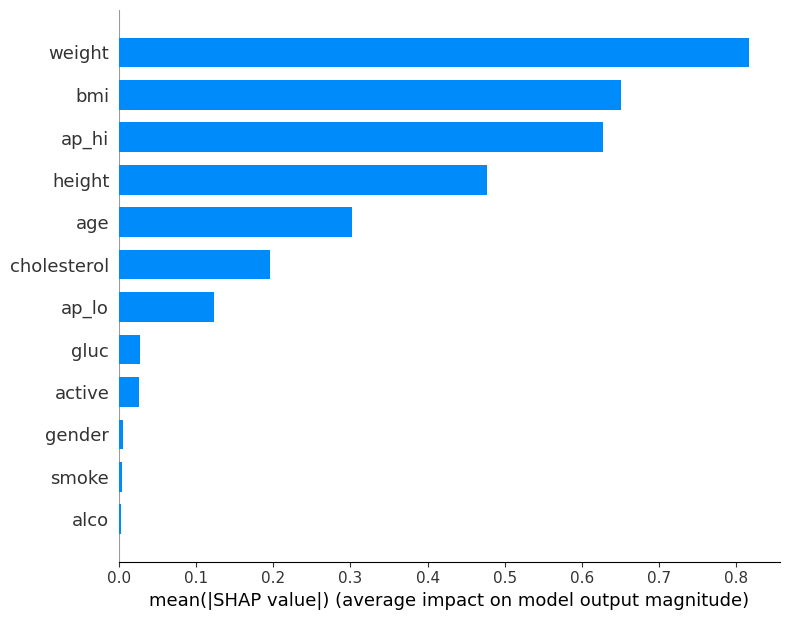

In [ ]:
shap.summary_plot(shap_values_log,test, plot_type="bar", class_names=['Healthy', 'Disease'])

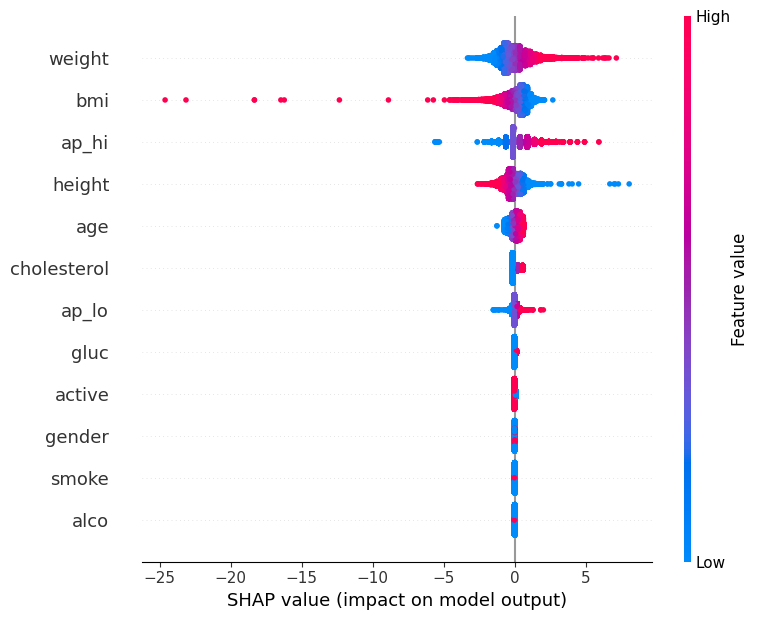

In [ ]:
# Visualize SHAP summary plot
shap.summary_plot(shap_values_log, test, feature_names=test.columns)

In [ ]:
# Visualize individual predictions with force plots
shap.initjs()
shap.plots.force(shap_values_log[0])

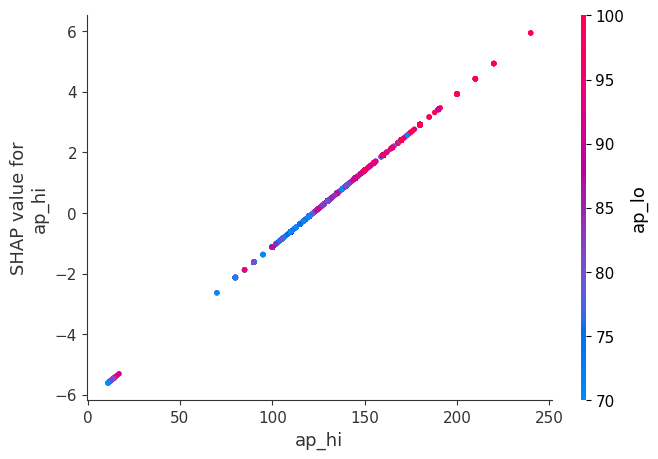

In [ ]:
# Visualize dependence plots for individual features
shap.dependence_plot('ap_hi', shap_values_log.values, test)
plt.show()

In [ ]:
d_train =xgb.DMatrix(train, label= target)
d_test =xgb.DMatrix(test, label= target_test)

In [ ]:
# XGB

params = {
    "eta": 0.01,
    "objective": "binary:logistic",
    "subsample": 0.5,
    "base_score": np.mean(Ytrain),
    "eval_metric": "logloss",
}

model = xgb.train(
    params,
    d_train,
    5000,
    evals=[(d_test, "test")],
    verbose_eval=100,
    early_stopping_rounds=20,
)

[0]	test-logloss:0.69057
[100]	test-logloss:0.56827
[200]	test-logloss:0.54566
[300]	test-logloss:0.54047
[400]	test-logloss:0.53886
[500]	test-logloss:0.53828
[600]	test-logloss:0.53809
[633]	test-logloss:0.53807


In [ ]:
# Make predictions for test data
y_pred_prob = model.predict(d_test)
y_pred_probt = model.predict(d_train)

# Convert probabilities to binary predictions (0 or 1)
y_pred = np.where(y_pred_prob > 0.5, 1, 0)
y_predt = np.where(y_pred_probt > 0.5, 1, 0)

# Evaluate predictions
accuracy_tr = accuracy_score(target, y_predt)
print("Training Accuracy(XGB):" , (accuracy_tr * 100))
accuracy_te = accuracy_score(target_test, y_pred)
print("Testing Accuracy(XGB):" , (accuracy_te * 100))

print("\nXG Boost Classification Report:")
print(classification_report(target_test, y_pred))

Training Accuracy(XGB): 74.64479884015948
Testing Accuracy(XGB): 73.85284523378036

XG Boost Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.78      0.75      6877
           1       0.76      0.69      0.73      6918

    accuracy                           0.74     13795
   macro avg       0.74      0.74      0.74     13795
weighted avg       0.74      0.74      0.74     13795



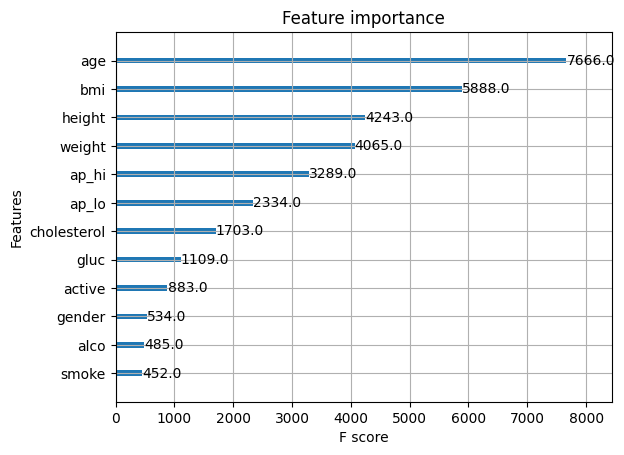

In [ ]:
xgb.plot_importance(model)
plt.show()
plt.close()

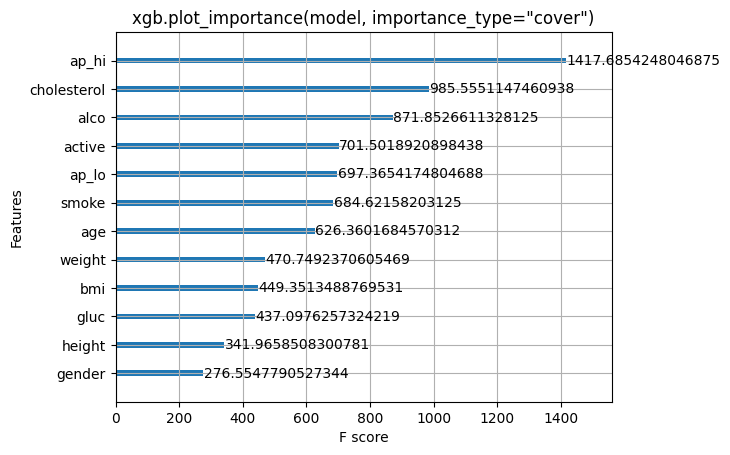

In [ ]:
xgb.plot_importance(model, importance_type="cover")
plt.title('xgb.plot_importance(model, importance_type="cover")')
plt.show()

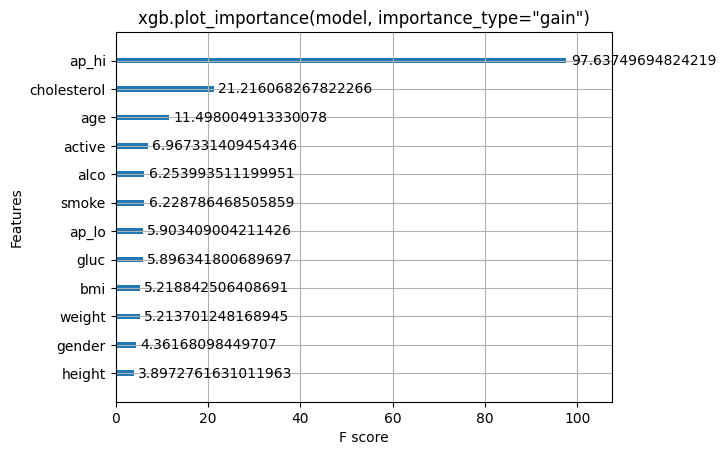

In [ ]:
xgb.plot_importance(model, importance_type="gain")
plt.title('xgb.plot_importance(model, importance_type="gain")')
plt.show()

In [ ]:
# Explain XGB predictions using SHAP
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(train)

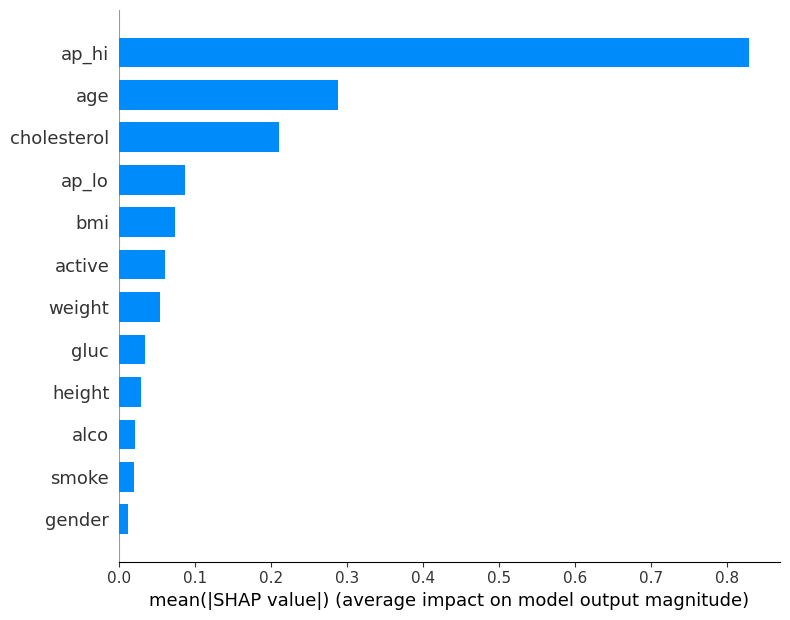

In [ ]:
shap.summary_plot(shap_values, train, plot_type="bar")

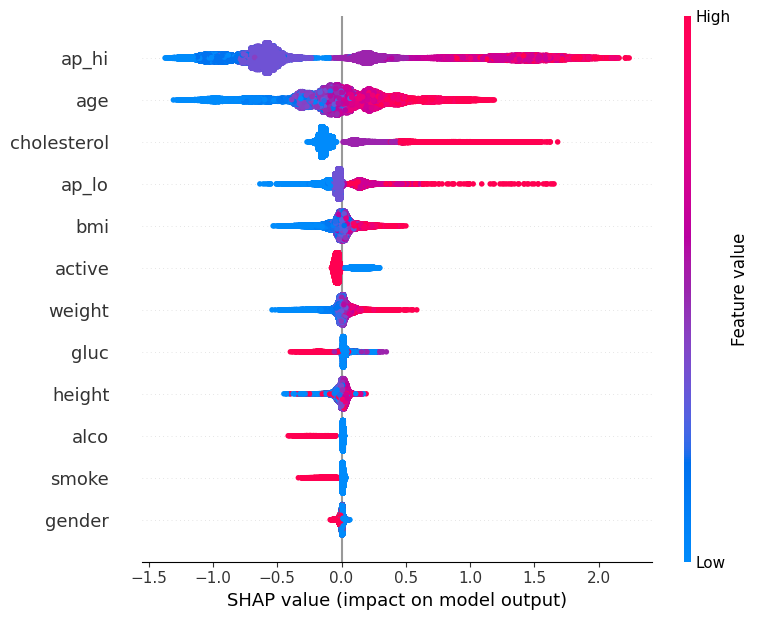

In [ ]:
shap.initjs()
# Visualize SHAP summary plot
shap.summary_plot(shap_values, train)

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0, :], train.iloc[0, :])

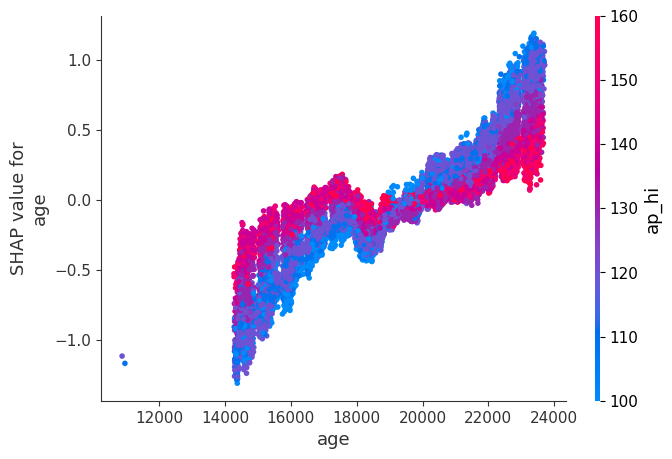

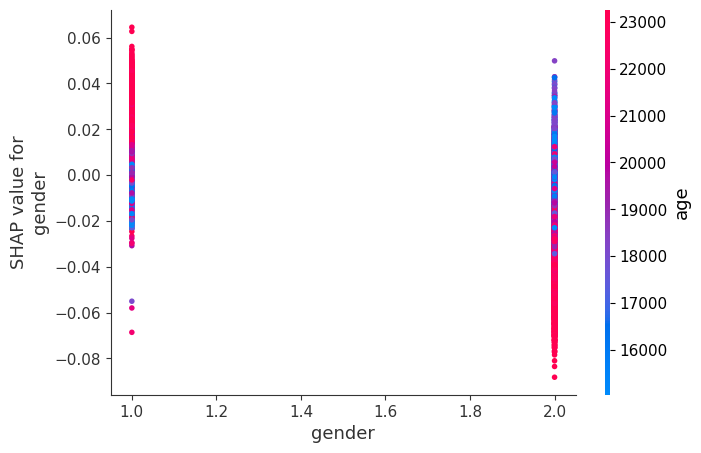

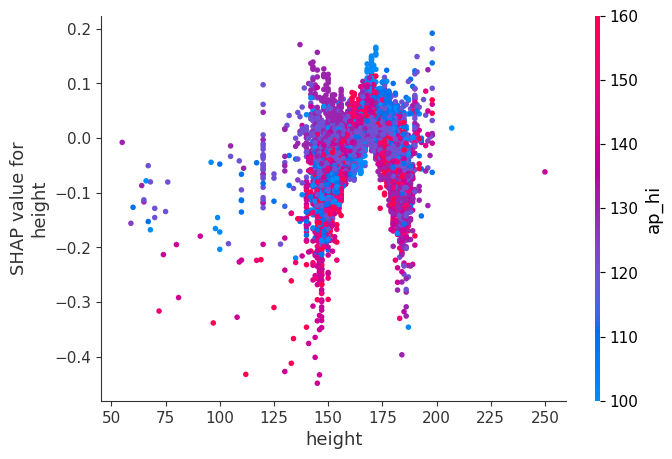

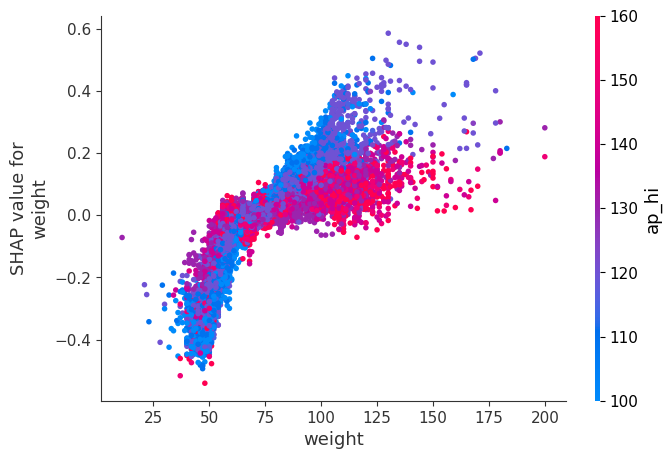

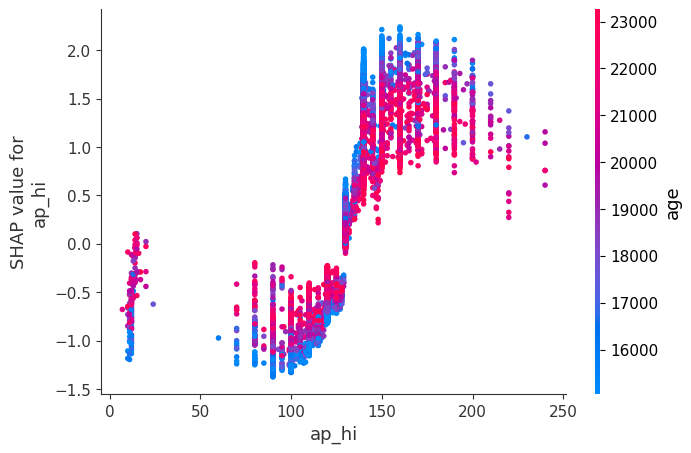

...

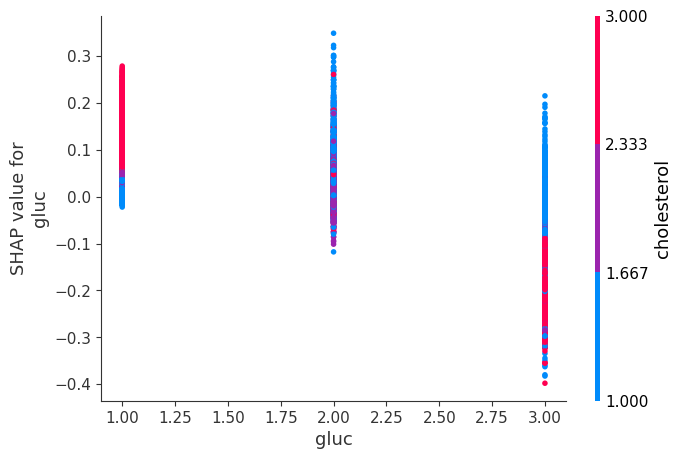

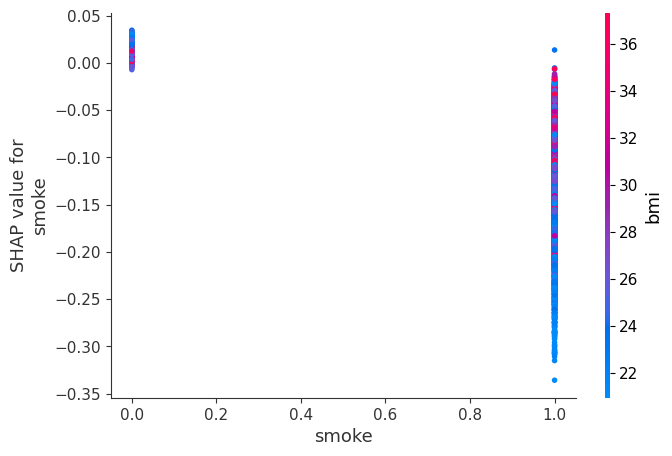

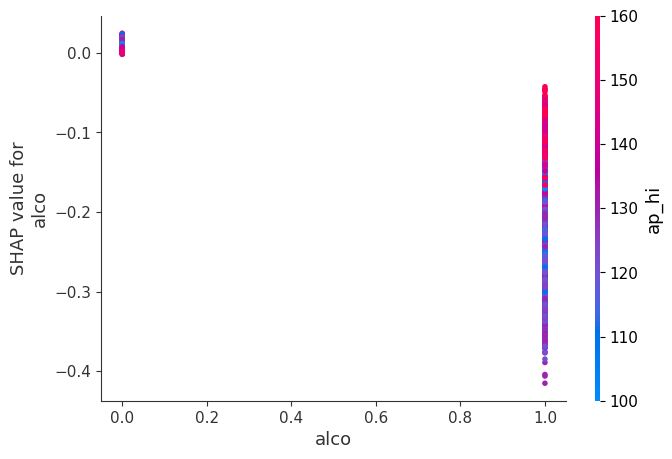

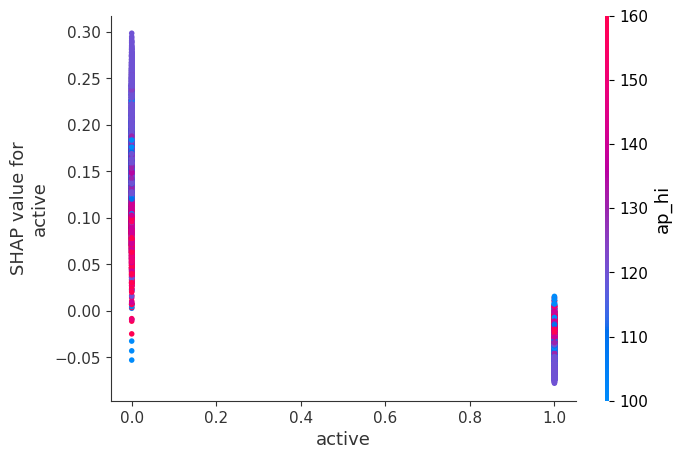

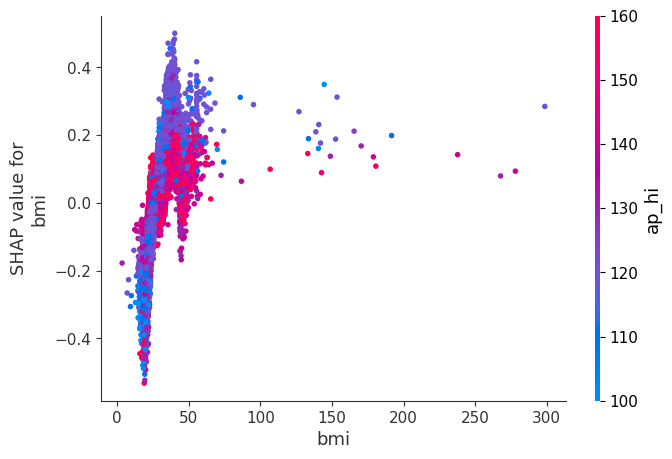

In [ ]:
for name in train.columns:
    shap.dependence_plot(name, shap_values, train, display_features= train)

In [ ]:
# Decision Tree Classifier

decision_tree = DecisionTreeClassifier()
decision_tree.fit(train, target)

y_pred_dt = decision_tree.predict(test)

acc_decision_tree = round(decision_tree.score(train, target) * 100, 2)
acc_decision_tree

acc_test_decision_tree = round(decision_tree.score(test, target_test) * 100, 2)
acc_test_decision_tree

# Print accuracy
print("Training Accuracy (Decision Tree):", acc_decision_tree)
print("Testing Accuracy (Decision Tree):", acc_test_decision_tree)

print("\nDecision Tree Classification Report:")
print(classification_report(target_test, y_pred_dt ))

Training Accuracy (Decision Tree): 99.98
Testing Accuracy (Decision Tree): 63.93

Decision Tree Classification Report:
              precision    recall  f1-score   support

           0       0.64      0.65      0.64      6877
           1       0.64      0.63      0.64      6918

    accuracy                           0.64     13795
   macro avg       0.64      0.64      0.64     13795
weighted avg       0.64      0.64      0.64     13795



In [ ]:
# Explain decision tree predictions using SHAP
explainer_dt = shap.TreeExplainer(decision_tree)
shap_values_dt = explainer_dt(test)

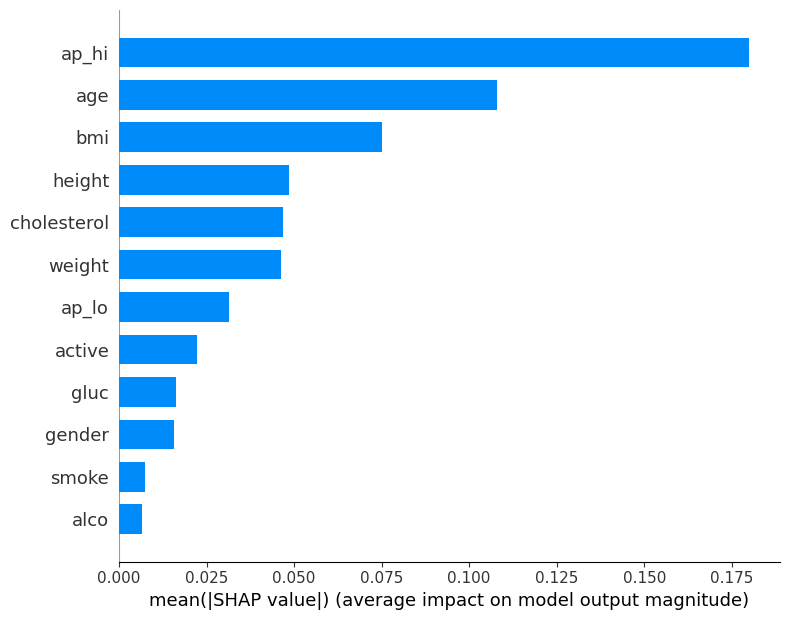

In [ ]:
shap.summary_plot(shap_values_dt[..., 0], train, plot_type="bar")

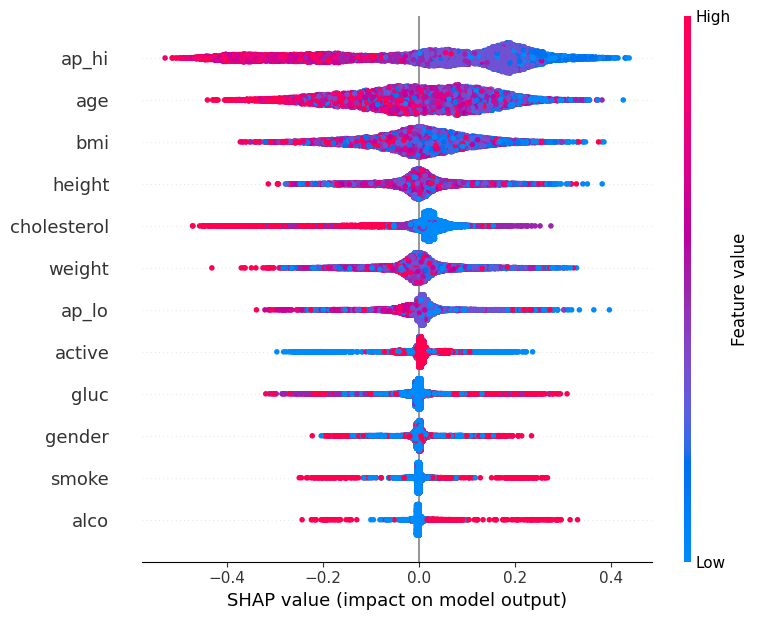

In [ ]:
# Visualize SHAP summary plot
shap.summary_plot(shap_values_dt[..., 0], test)

In [ ]:
shap.initjs()
# Visualize individual predictions with force plots
shap.force_plot(explainer_dt.expected_value[0], shap_values_dt.values[0, :])

In [ ]:
# Random Forest

rf = RandomForestClassifier()
rf.fit(train, target)
y_pred_rf = rf.predict(test)
y_pred_rf_train = rf.predict(train)

# Print accuracy
accuracy_rft = accuracy_score(target, y_pred_rf_train)
print("Training Accuracy (Random Forest ):", accuracy_rft*100)
accuracy_rf = accuracy_score(target_test, y_pred_rf)
print("Testing Accuracy (Random Forest):", accuracy_rf*100)

print("\nRandom Forest Classification Report:")
print(classification_report(target_test, y_pred_rf ))

Training Accuracy (Random Forest ): 99.97462848858282
Testing Accuracy (Random Forest): 71.45342515404131

Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.73      0.72      6877
           1       0.72      0.70      0.71      6918

    accuracy                           0.71     13795
   macro avg       0.71      0.71      0.71     13795
weighted avg       0.71      0.71      0.71     13795



In [ ]:
df_fi = pd.DataFrame()
df_fi['feature'] = train.columns
df_fi['importance'] = rf.feature_importances_

df_fi.sort_values('importance', ascending=False).head(10)

,feature,importance
0,age,0.262283
4,ap_hi,0.176900
11,bmi,0.161245
3,weight,0.115085
2,height,0.109933
5,ap_lo,0.075943
6,cholesterol,0.036173
1,gender,0.016398
7,gluc,0.016283
10,active,0.013773


In [ ]:
# Explain Random Forest predictions using SHAP
train_sample = train.sample(500, random_state=12)
explainer_rf = shap.TreeExplainer(rf)
shap_values_rf = explainer_rf.shap_values(train_sample)

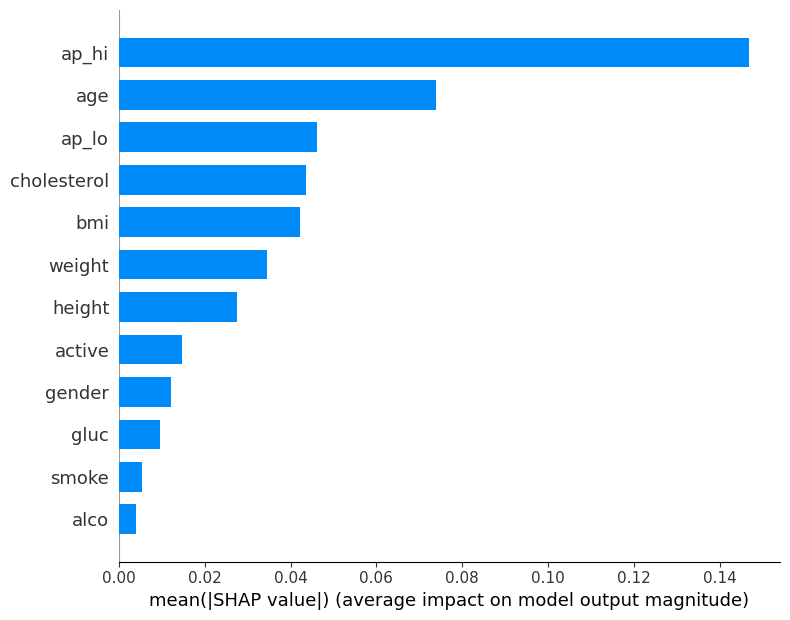

In [ ]:
# Visualize SHAP summary plot
shap.summary_plot(shap_values_rf[...,0], train_sample,plot_type="bar")

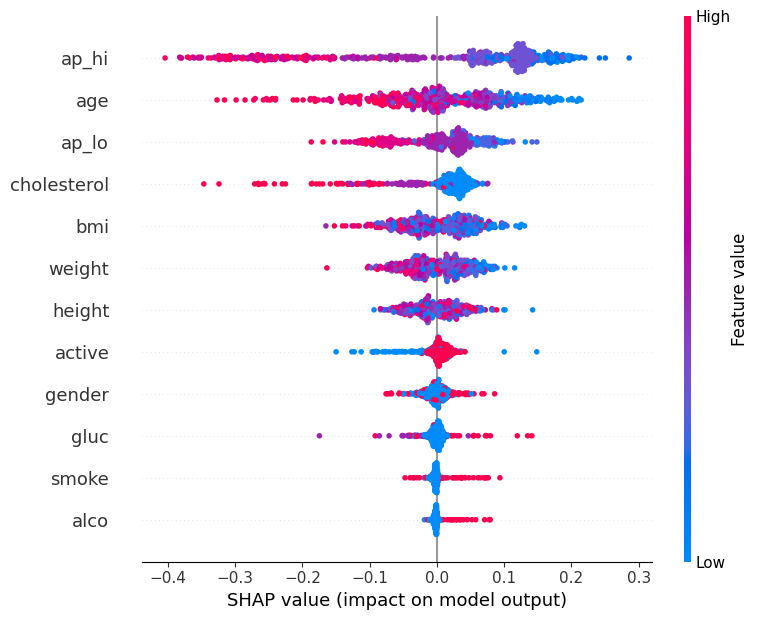

In [ ]:
# Visualize SHAP summary plot
shap.summary_plot(shap_values_rf[...,0], train_sample)

In [ ]:
shap.initjs()
# Visualize individual predictions with force plots
shap.force_plot(explainer_rf.expected_value[0], shap_values_rf[...,0], train_sample)

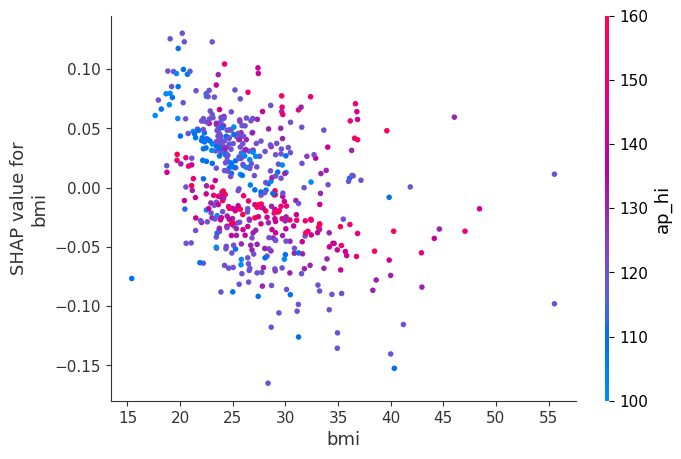

In [ ]:
shap.dependence_plot("bmi", shap_values_rf[...,0], train_sample)

In [ ]:
#CatBoost

Cat_Boost = CatBoostRegressor(iterations=300, learning_rate=0.1, random_seed=123)
Cat_Boost.fit(train, target, verbose=False, plot=False)
Cat_Boost.score(train, target)
y_pred_cb = Cat_Boost.predict(test)

acc_CatBoost = round(Cat_Boost.score(train, target) * 100,4)
print("Training Accuracy (CatBoost): " , acc_CatBoost)
acct_CatBoost = round(Cat_Boost.score(test, target_test) * 100,4)
print("Testing Accuracy (CatBoost): " , acct_CatBoost)

# print("\nCatBoost Classification Report:")
# print(classification_report(target_test, y_pred_cb ))

Training Accuracy (CatBoost):  30.3536
Testing Accuracy (CatBoost):  28.1755


In [ ]:
# Explain model predictions using SHAP
explainer_cb = shap.TreeExplainer(Cat_Boost)
shap_values_cb = explainer_cb(train)

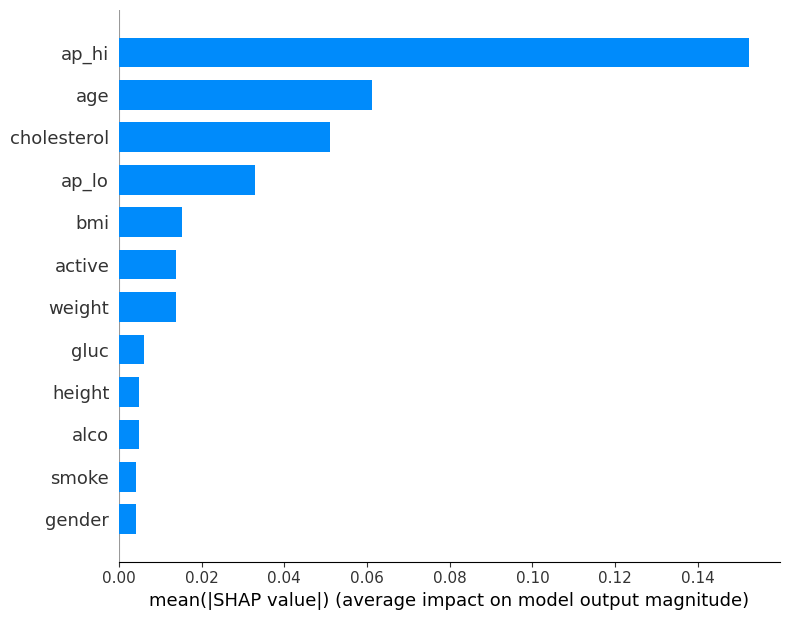

In [ ]:
shap.summary_plot(shap_values_cb, train, plot_type="bar")

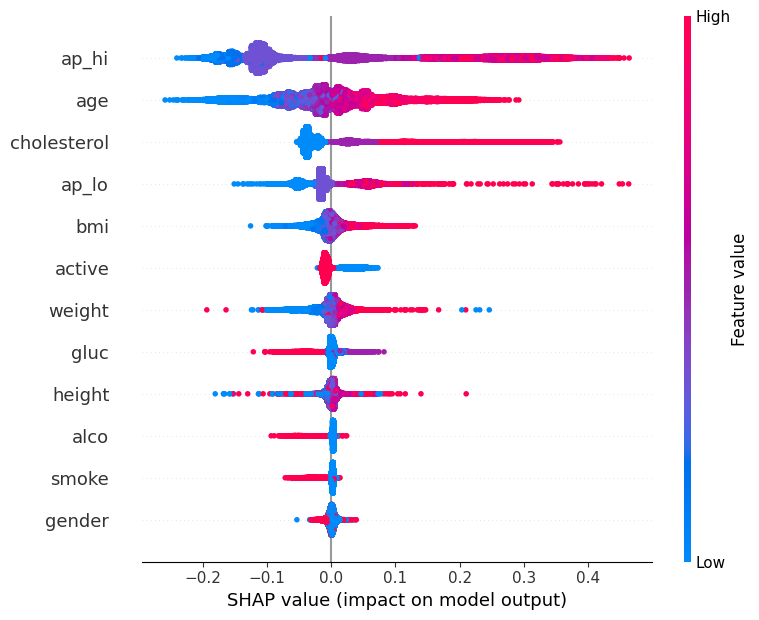

In [ ]:
# Visualize SHAP summary plot
shap.summary_plot(shap_values_cb)

In [ ]:
shap.initjs()
# Visualize the first prediction's explanation
shap.plots.force(shap_values_cb[0, ...])

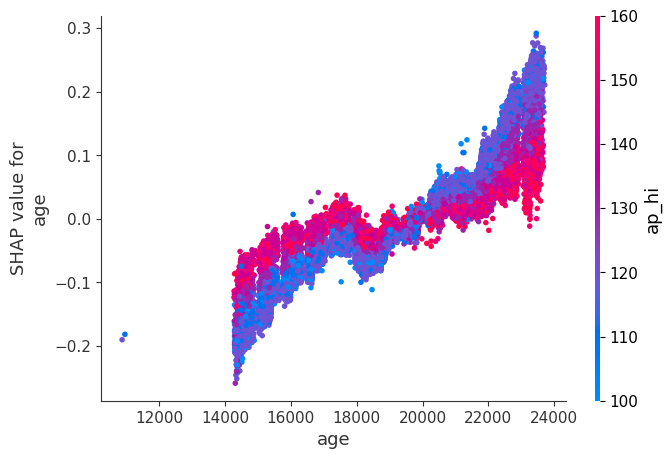

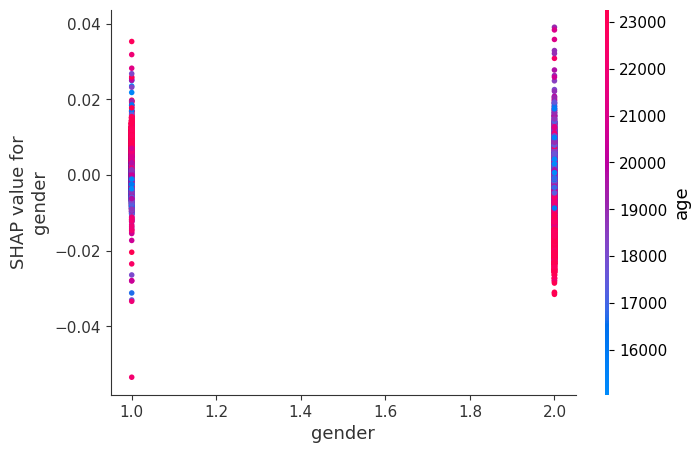

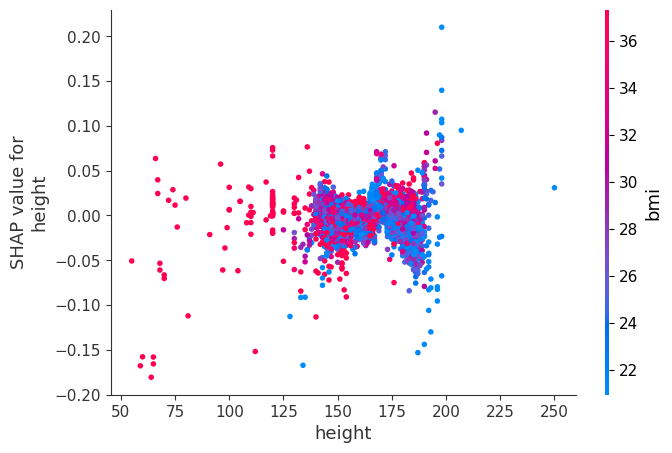

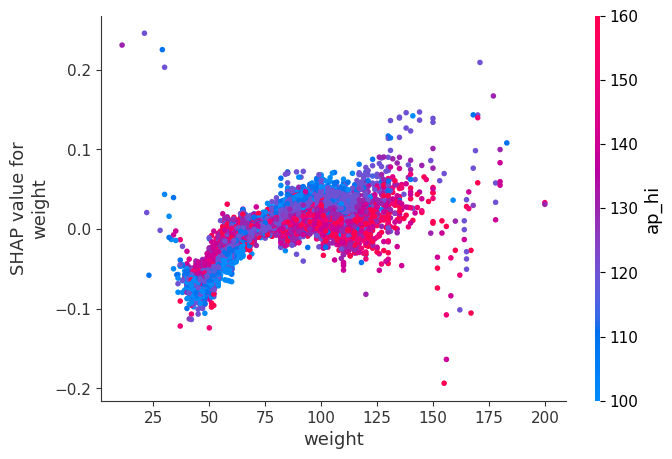

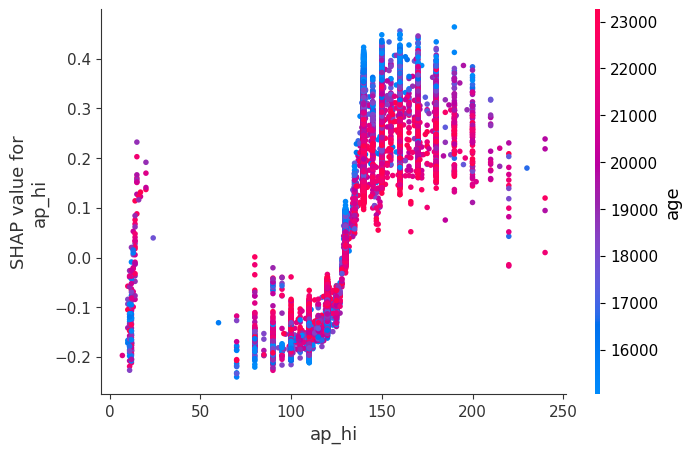

...

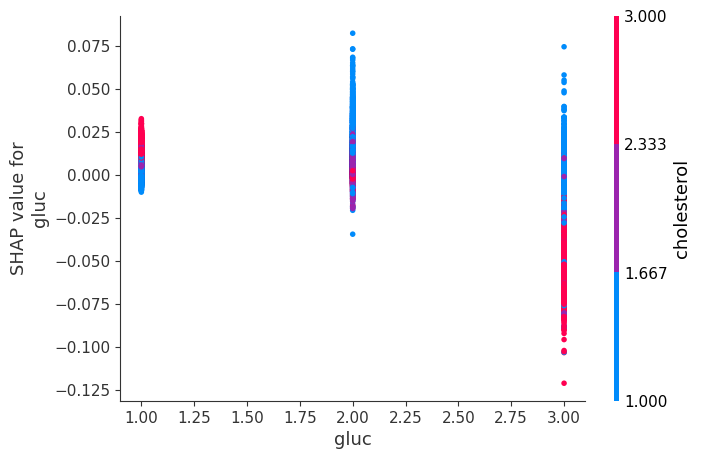

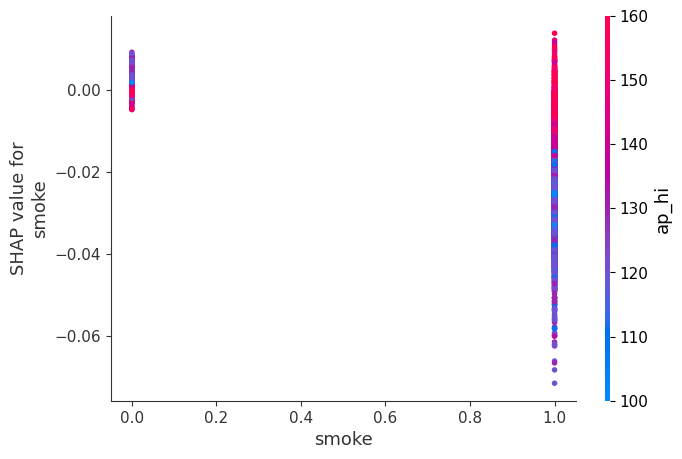

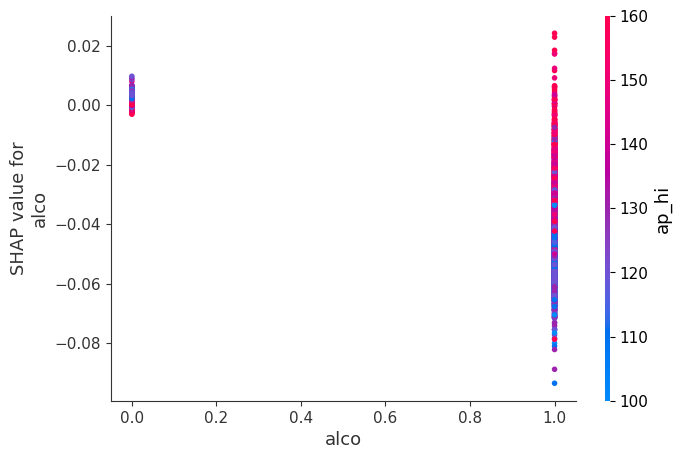

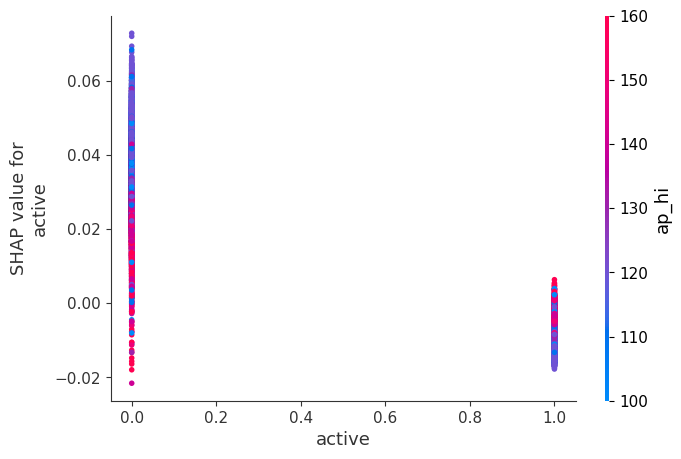

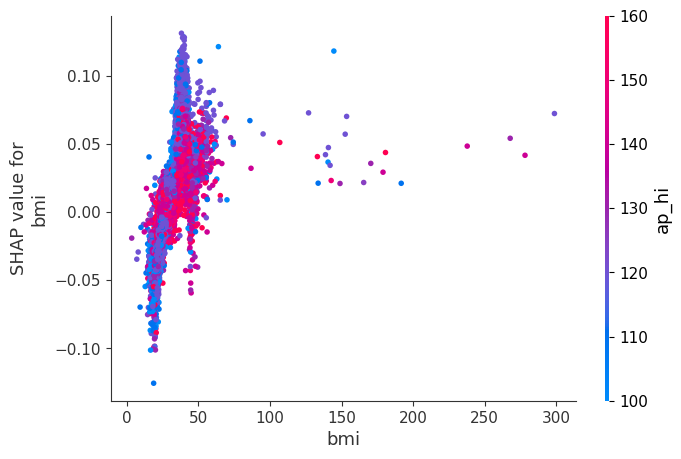

In [ ]:
for name in train.columns:
  shap.dependence_plot(name, shap_values_cb.values, train)

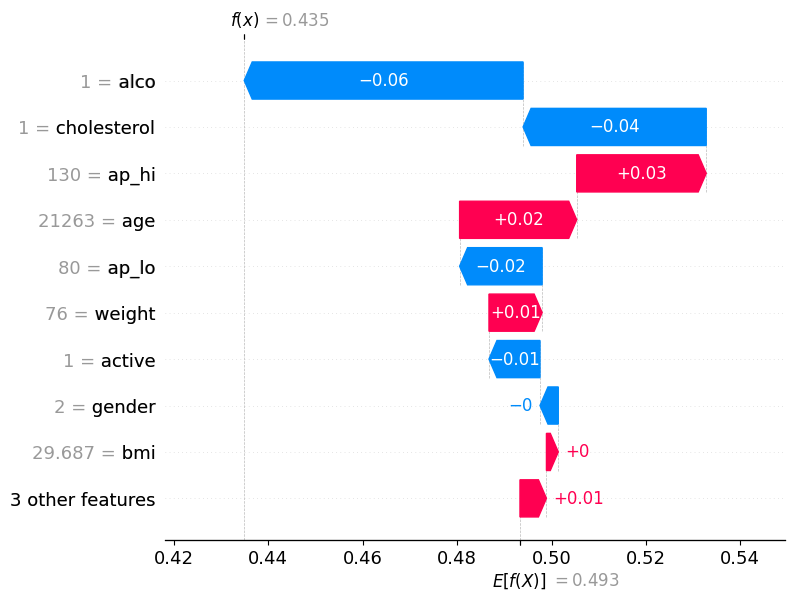

In [ ]:
shap.plots.waterfall(shap_values_cb[0])

In [ ]:
dd_train = lgb.Dataset(train, label=target)
dd_test = lgb.Dataset(test, label=target_test)

In [ ]:
#LGBM

params = {
    "max_bin": 512,
    "learning_rate": 0.05,
    "boosting_type": "gbdt",
    "objective": "binary",
    "metric": "binary_logloss",
    "num_leaves": 10,
    "verbose": -1,
    "min_data": 100,
    "boost_from_average": True,
    "early_stopping_round": 50,
}

lgbm = lgb.train(
    params,
    dd_train,
    10000,
    valid_sets=[dd_test],
)

In [ ]:
# Make predictions for test data
y_predl = lgbm.predict(test)
predictions = [round(value) for value in y_predl]
y_predlt = lgbm.predict(train)
predictions_t = [round(value) for value in y_predlt]
# Evaluate predictions
accuracy_lgbm = accuracy_score(target, predictions_t)
print("Training Accuracy (LGBM):" , (accuracy_lgbm * 100))
accuracy_lgbmt = accuracy_score(target_test, predictions)
print("Testing Accuracy (LGBM):" , (accuracy_lgbmt * 100))

print("\nLGBM Classification Report:")
print(classification_report(target_test, predictions))

Training Accuracy (LGBM): 74.04856832185574
Testing Accuracy (LGBM): 73.8600942370424

LGBM Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.78      0.75      6877
           1       0.76      0.70      0.73      6918

    accuracy                           0.74     13795
   macro avg       0.74      0.74      0.74     13795
weighted avg       0.74      0.74      0.74     13795



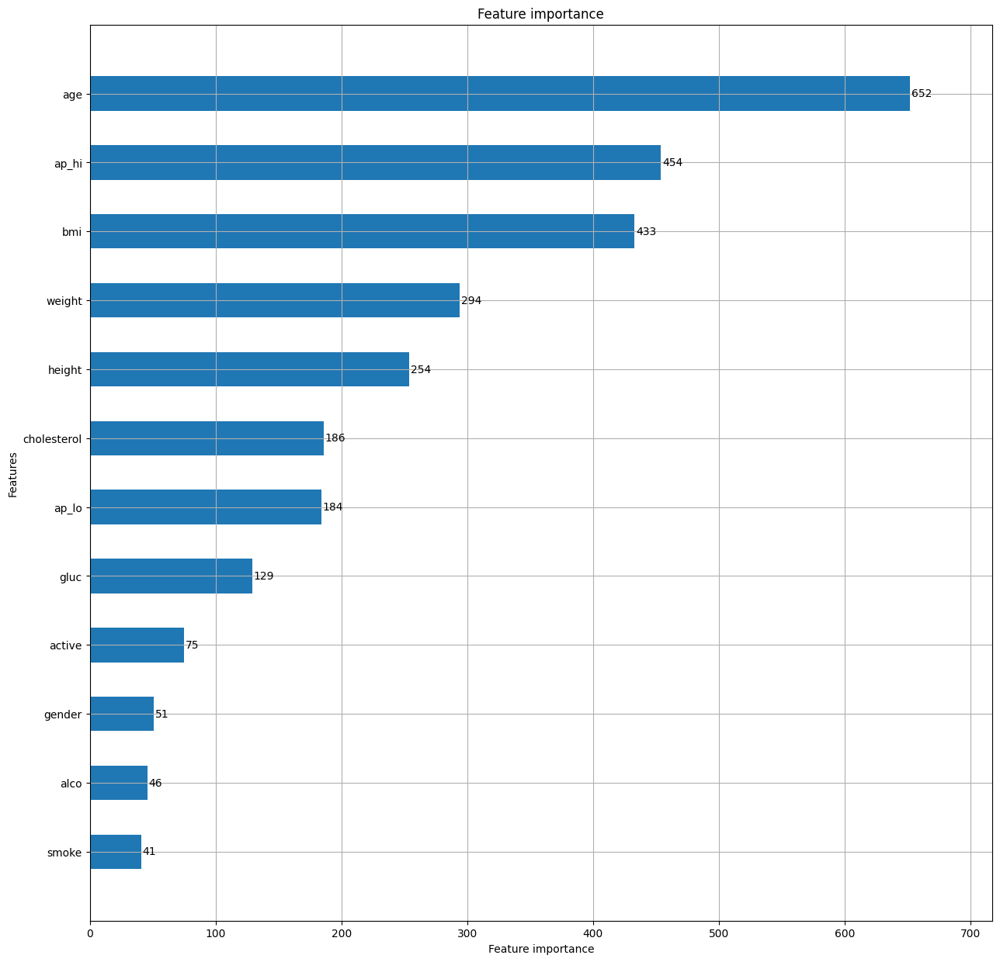

In [ ]:
fig =  plt.figure(figsize = (15,15))
axes = fig.add_subplot(111)
lgb.plot_importance(lgbm,ax = axes,height = 0.5)
plt.show()
plt.close()

In [ ]:
# Explain LGBM predictions using SHAP
explainer_lgb = shap.TreeExplainer(model)
shap_values_lgb = explainer_lgb(test)

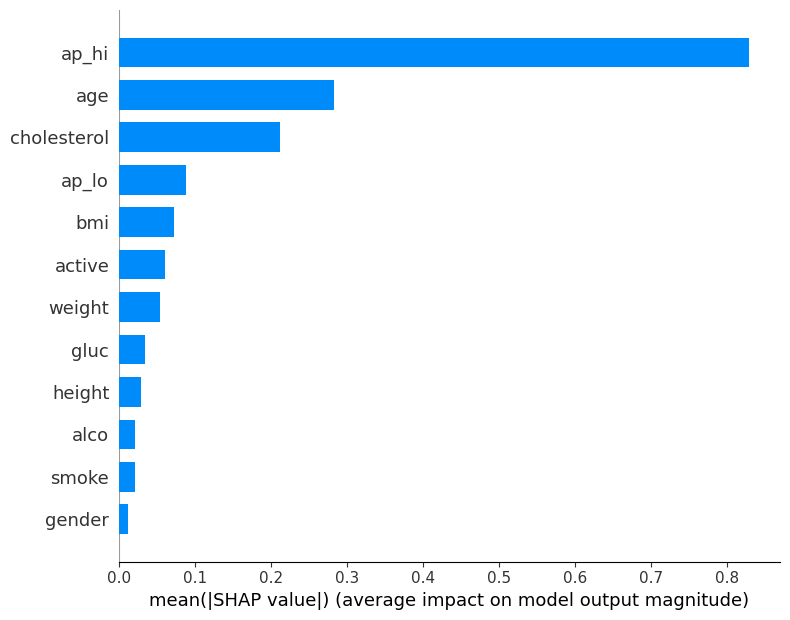

In [ ]:
shap.summary_plot(shap_values_lgb, train, plot_type="bar")

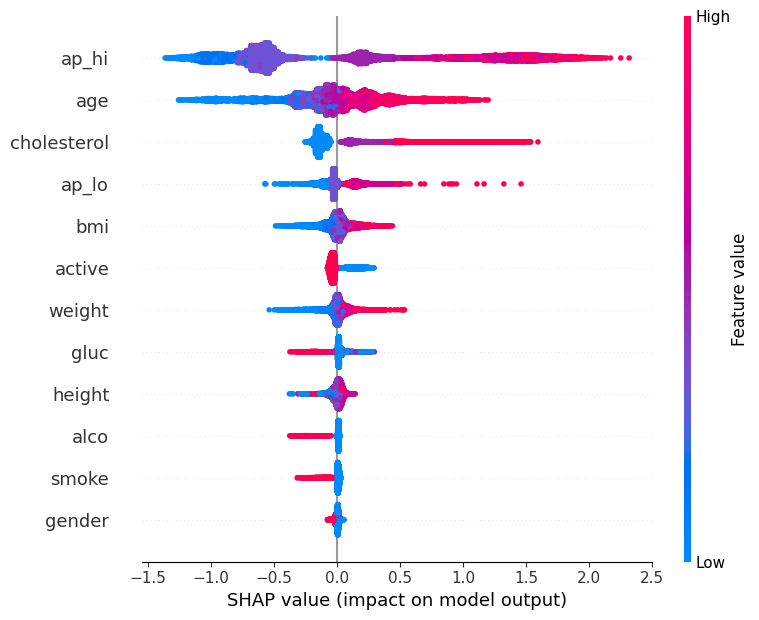

In [ ]:
# Visualize SHAP summary plot
shap.summary_plot(shap_values_lgb)

In [ ]:
shap.initjs()
# Visualize individual predictions with force plots
shap.force_plot(explainer_lgb.expected_value, shap_values_lgb.values[1, :], train.iloc[0, :])

In [ ]:
allmodels = pd.DataFrame({
    'Model': ['Logistic Regression', 'XGBClassifier','Decision Tree Classifier',
              'Random Forest','CatBoostClassifier'  , 'LGBMClassifier'],

    'Score_train': [accuracy_logregt*100, accuracy_tr*100, acc_decision_tree, accuracy_rft*100,  acc_CatBoost, accuracy_lgbm * 100 ],
    'Score_test': [accuracy_logreg*100, accuracy_te*100, acc_test_decision_tree, accuracy_rf*100,  acct_CatBoost, accuracy_lgbmt * 100]
                    })

In [ ]:
allmodels.sort_values(by=['Score_train', 'Score_test'], ascending=False)

,Model,Score_train,Score_test
2,Decision Tree Classifier,99.980000,63.930000
3,Random Forest,99.974628,71.453425
1,XGBClassifier,74.644799,73.852845
5,LGBMClassifier,74.048568,73.860094
0,Logistic Regression,72.194636,72.591519
4,CatBoostClassifier,30.353600,28.175500


from matplotlib import pyplot as plt
_df_12['index'].plot(kind='hist', bins=20, title='index')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_13['Score_train'].plot(kind='hist', bins=20, title='Score_train')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_14['Score_test'].plot(kind='hist', bins=20, title='Score_test')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_15.groupby('Model').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_16.plot(kind='scatter', x='index', y='Score_train', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_17.plot(kind='scatter', x='Score_train', y='Score_test', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_18['index'].plot(kind='line', figsize=(8, 4), title='index')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_19['Score_train'].plot(kind='line', figsize=(8, 4), title='Score_train')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_20['Score_test'].plot(kind='line', figsize=(8, 4), title='Score_test')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_21['Model'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_21, x='index', y='Model', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_22['Model'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_22, x='Score_train', y='Model', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_23['Model'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_23, x='Score_test', y='Model', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [ ]:
allmodels.sort_values(by=['Score_test', 'Score_train'], ascending=False)

,Model,Score_train,Score_test
5,LGBMClassifier,74.048568,73.860094
1,XGBClassifier,74.644799,73.852845
0,Logistic Regression,72.194636,72.591519
3,Random Forest,99.974628,71.453425
2,Decision Tree Classifier,99.980000,63.930000
4,CatBoostClassifier,30.353600,28.175500


from matplotlib import pyplot as plt
_df_0['index'].plot(kind='hist', bins=20, title='index')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_1['Score_train'].plot(kind='hist', bins=20, title='Score_train')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_2['Score_test'].plot(kind='hist', bins=20, title='Score_test')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_3.groupby('Model').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_4.plot(kind='scatter', x='index', y='Score_train', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_5.plot(kind='scatter', x='Score_train', y='Score_test', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_6['index'].plot(kind='line', figsize=(8, 4), title='index')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_7['Score_train'].plot(kind='line', figsize=(8, 4), title='Score_train')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_8['Score_test'].plot(kind='line', figsize=(8, 4), title='Score_test')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_9['Model'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_9, x='index', y='Model', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_10['Model'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_10, x='Score_train', y='Model', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_11['Model'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_11, x='Score_test', y='Model', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [ ]:
allmodels['Score_diff'] = abs(allmodels['Score_train'] - allmodels['Score_test'])
allmodels.sort_values(by=['Score_diff'], ascending=True)

,Model,Score_train,Score_test,Score_diff
5,LGBMClassifier,74.048568,73.860094,0.188474
0,Logistic Regression,72.194636,72.591519,0.396883
1,XGBClassifier,74.644799,73.852845,0.791954
4,CatBoostClassifier,30.353600,28.175500,2.178100
3,Random Forest,99.974628,71.453425,28.521203
2,Decision Tree Classifier,99.980000,63.930000,36.050000


from matplotlib import pyplot as plt
_df_24['Score_train'].plot(kind='hist', bins=20, title='Score_train')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_25['Score_test'].plot(kind='hist', bins=20, title='Score_test')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_26['Score_diff'].plot(kind='hist', bins=20, title='Score_diff')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_27.groupby('Model').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_28.plot(kind='scatter', x='Score_train', y='Score_test', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_29.plot(kind='scatter', x='Score_test', y='Score_diff', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Score_diff']
  ys = series['Score_train']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_30.sort_values('Score_diff', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Model')):
  _plot_series(series, series_name, i)
  fig.legend(title='Model', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Score_diff')
_ = plt.ylabel('Score_train')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Score_diff']
  ys = series['Score_test']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_31.sort_values('Score_diff', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Model')):
  _plot_series(series, series_name, i)
  fig.legend(title='Model', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Score_diff')
_ = plt.ylabel('Score_test')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Score_diff']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Score_diff'}, axis=1)
              .sort_values('Score_diff', ascending=True))
  xs = counted['Score_diff']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_32.sort_values('Score_diff', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Model')):
  _plot_series(series, series_name, i)
  fig.legend(title='Model', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Score_diff')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
_df_33['Score_train'].plot(kind='line', figsize=(8, 4), title='Score_train')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_34['Score_test'].plot(kind='line', figsize=(8, 4), title='Score_test')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_35['Score_diff'].plot(kind='line', figsize=(8, 4), title='Score_diff')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_36['Model'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_36, x='Score_train', y='Model', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_37['Model'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_37, x='Score_test', y='Model', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_38['Model'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_38, x='Score_diff', y='Model', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
_df_39['index'].plot(kind='hist', bins=20, title='index')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_40['Score_train'].plot(kind='hist', bins=20, title='Score_train')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_41['Score_test'].plot(kind='hist', bins=20, title='Score_test')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_42['Score_diff'].plot(kind='hist', bins=20, title='Score_diff')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_43.groupby('Model').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_44.plot(kind='scatter', x='index', y='Score_train', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_45.plot(kind='scatter', x='Score_train', y='Score_test', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_46.plot(kind='scatter', x='Score_test', y='Score_diff', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Score_diff']
  ys = series['index']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_47.sort_values('Score_diff', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Model')):
  _plot_series(series, series_name, i)
  fig.legend(title='Model', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Score_diff')
_ = plt.ylabel('index')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Score_diff']
  ys = series['Score_train']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_48.sort_values('Score_diff', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Model')):
  _plot_series(series, series_name, i)
  fig.legend(title='Model', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Score_diff')
_ = plt.ylabel('Score_train')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Score_diff']
  ys = series['Score_test']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_49.sort_values('Score_diff', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Model')):
  _plot_series(series, series_name, i)
  fig.legend(title='Model', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Score_diff')
_ = plt.ylabel('Score_test')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Score_diff']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Score_diff'}, axis=1)
              .sort_values('Score_diff', ascending=True))
  xs = counted['Score_diff']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_50.sort_values('Score_diff', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Model')):
  _plot_series(series, series_name, i)
  fig.legend(title='Model', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Score_diff')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
_df_51['index'].plot(kind='line', figsize=(8, 4), title='index')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_52['Score_train'].plot(kind='line', figsize=(8, 4), title='Score_train')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_53['Score_test'].plot(kind='line', figsize=(8, 4), title='Score_test')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_54['Score_diff'].plot(kind='line', figsize=(8, 4), title='Score_diff')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_55['Model'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_55, x='index', y='Model', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_56['Model'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_56, x='Score_train', y='Model', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_57['Model'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_57, x='Score_test', y='Model', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_58['Model'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_58, x='Score_diff', y='Model', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)